In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from mcmodels.core import Mask
import os
import allensdk.core.json_utilities as ju
from allensdk.core.mouse_connectivity_cache import MouseConnectivityCache
from mcmodels.core import VoxelModelCache
from matplotlib.pyplot import gcf
import matplotlib.patches as mpatches
import seaborn as sns

/Users/samsonkoelle/anaconda3/envs/allen_010719_5/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.linear_model.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.linear_model. Anything that cannot be imported from sklearn.linear_model is now part of the private API.
  warnings.warn(message, FutureWarning)
/Users/samsonkoelle/anaconda3/envs/allen_010719_5/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
2+2

4

In [3]:

def fix_pdcsv(csv):
    
    #wt_conn = pd.read_csv('/Users/samsonkoelle/wt_leafsmooth_leafsurface_sumtarget.csv',  header=[0,1])
    csv_rownames = np.asarray(csv.iloc[:,0])
    csv = csv.iloc[:,1:]
    csv.index = csv_rownames
    return(csv)

def fill_df_na(data, indices):
    
    for i in range(indices.shape[0]):
        data.iloc[indices[i,0],indices[i,1]] = np.nan
        
    return(data)



In [149]:
major_structures = ['CB',
 'CTXsp',
 'HPF',
 'HY',
 'Isocortex',
 'MB',
 'MY',
 'OLF',
 'P',
 'PAL',
 'STR',
 'TH']

wt_conn = pd.read_csv('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/connectivities/elsumsurfleafsmth_v3_leafsum_wt.csv', header = [0,1])
wt_conn = fix_pdcsv(wt_conn)

#load data
dists = pd.read_csv('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/analyses/paper/getinfo/distances.csv',  header=[0,1])
dists = fix_pdcsv(dists)

nonzero_ind = np.where(np.sum(wt_conn, axis = 1) > 0)[0]
wt_conn_nonzero = wt_conn.iloc[nonzero_ind]
wt_conn_nonzero[wt_conn_nonzero < 1e-5] = 0
wt_conn_nonzero_log = np.log10(wt_conn_nonzero)
wt_conn_nonzero_log.replace([-np.inf], -5, inplace=True)
#wt_conn_nonzero_log[wt_conn_nonzero_log < -5] = -5
#sns.heatmap(wt_conn_nonzero_log, vmin = -5, vmax = 0)

/Users/samsonkoelle/anaconda3/envs/allen_010719_5/lib/python3.7/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/samsonkoelle/anaconda3/envs/allen_010719_5/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in log10


In [150]:
major_ontoloogy_summary = np.load('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/info/ontological_order_summary_majors_names_v3.npy')
targ_sum_major_names = np.load('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/info/targ_sum_major_names.npy')

source_leaf_major_names = np.load('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/info/source_leaf_major_names.npy')


In [151]:
ncol = targ_sum_major_names.shape[0]
nrow = source_leaf_major_names.shape[0]

In [152]:
palette = np.hstack([np.asarray(sns.color_palette("Spectral", 12)), np.expand_dims(np.ones(12),1)])
palette_dict = {}
for i in range(12):
    palette_dict[major_structures[i]] = palette[i]

ccol = np.zeros((ncol,4), dtype  =float)
for i in range(ncol):
    ccol[i,:] = np.asarray(palette_dict[targ_sum_major_names[i]])
    
ccol[313:, 3 ] = .02

#nrow = np.zeros((nrow,4), dtype  =float)

crow = np.zeros((nrow,4), dtype  =float)
for i in range(nrow):
    crow[i,:] = np.asarray(palette_dict[source_leaf_major_names[i]])
crow = crow[nonzero_ind]

In [153]:
import matplotlib as mpl
from pylab import rcParams

mpl.rcParams['text.usetex'] = True
mpl.rcParams['text.latex.preamble'] = [r'\usepackage{amsmath}'] #for \text command

reo = [4,7,2,1,10,9,11,3,5,8,6,0]
#handles = [mpatches.Patch(color =  ccol_dict[major_structures[i]], label = major_structures[i]) for i in reo]

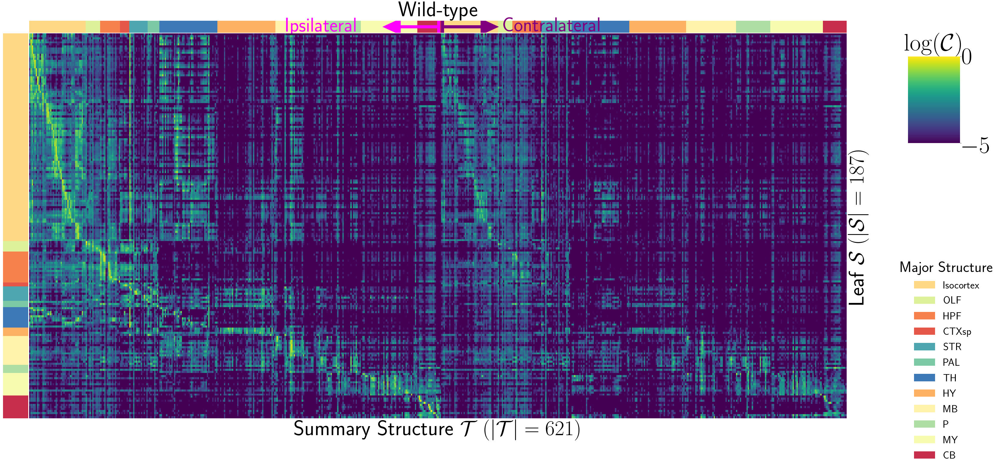

In [461]:
g= sns.clustermap(wt_conn_nonzero_log, col_cluster = False, row_cluster = False, col_colors=ccol, 
                  row_colors = crow, figsize = (40,20), cmap = 'viridis', vmin = -5, vmax = 0.,
                 dendrogram_ratio=(0,0.01),cbar_kws={"ticks":[-5,0]})
#labels = list(g.ax_cbar.get_yticklabels()).copy()#g.ax_cbar.get_yticklabels()
#print(list(labels))
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_yticks([])
g.ax_heatmap.set_yticklabels([])
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xlabel('Summary Structure ' + r"$\mathcal T \; (|\mathcal T| = 621)$", fontsize = 70)
g.ax_heatmap.set_ylabel('Leaf ' + r"$\mathcal S \; (|\mathcal S| = 187)$", fontsize = 70)
ax = gcf().add_axes((0.6,1.,0.,0.))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
for label in np.asarray(major_structures)[reo]:
    ax.bar(0, 0, color=palette_dict[label], label=label, linewidth=0.)
l4 = ax.legend(title='Major Structure', ncol=1, bbox_to_anchor=(1.16, .45), bbox_transform=gcf().transFigure, fontsize = 35,title_fontsize=50,frameon=False)    

g.ax_cbar.set_title(r"$\log (\mathcal C)$", rotation=0, fontsize = 80)
g.ax_cbar.set_yticklabels(g.ax_cbar.get_yticklabels(), fontsize=80)
g.ax_cbar.set_position([1.05,0.7,.06,.2])
g.ax_col_colors.text(195.,.9, 'Ipsilateral', fontsize = 65, color  = 'fuchsia')
g.ax_col_colors.text(360.,.9, 'Contralateral', fontsize = 65, color  = 'purple')
g.ax_col_colors.axvline(311, color = 'fuchsia', linewidth  = 10)
g.ax_col_colors.arrow(311,.5,-30,0, color = 'fuchsia', linewidth  = 10,head_width=1., head_length=10)
g.ax_col_colors.arrow(314,.5,30,0, color = 'purple', linewidth  = 10,head_width=1., head_length=10)
g.ax_col_colors.axvline(314, color = 'purple', linewidth  = 10)
g.ax_col_colors.set_title('Wild-type', fontsize = 70)

plt.margins(x=0,y=0)
g.savefig('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/KoelleConnectivity/wt_conn_sumleaf_strength', pad_inches = 0,bbox_inches = 'tight')

In [155]:
#sns.heatmap(wt_conn_nonzero_log.T.corr())

In [156]:
#sns.heatmap(wt_conn_nonzero_log.corr())

In [157]:
#scipy.cor(wt_conn_nonzero_log)
from scipy.stats import entropy

In [158]:
def get_sparsity(vec):
    output = len(np.where(vec == 0 )[0]) / len(vec)
    return(output)

In [163]:
#top 5 entropy sources
# wt_conn_nonzero_np = np.asarray(wt_conn_nonzero)
# source_entropies = entropy(wt_conn_nonzero.transpose())
# source_sparsities = np.asarray([get_sparsity(wt_conn_nonzero_np[i]) for i in range(len(nonzero_ind))])
# source_statistics  = pd.DataFrame([source_leaf_major_names[nonzero_ind], source_entropies, source_sparsities]).transpose()
#entropy(wt_conn_nonzero.transpose())
#top 5 volume targets
#top 5 entropy targets
#lowest entropy targets

#mean sparsity
#nleafs
#nsummary structures
#top sparsest
#top least sparse

In [ ]:
#idx = df.groupby(['Mt'])['count'].transform(max) == df['count']

#In [4]: df[idx]

In [356]:
rnames = np.asarray(list(wt_conn.index))[nonzero_ind]
list1 = source_leaf_major_names[nonzero_ind]
list2 = rnames
#list2 = targ_sum_major_names[:321]

In [360]:
wt_conn_nonzero_np = np.asarray(wt_conn_nonzero)
source_entropies = entropy(wt_conn_nonzero.transpose())
source_sparsities = np.asarray([get_sparsity(wt_conn_nonzero_np[i]) for i in range(len(nonzero_ind))])
source_statistics  = pd.DataFrame([source_leaf_major_names[nonzero_ind], source_entropies, source_sparsities]).transpose()

idx = source_statistics.groupby([0])[1].transform(max) == source_statistics[1]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
top_source_entropy = DataFrame.from_dict(idx).transpose()

idx = source_statistics.groupby([0])[2].transform(max) == source_statistics[2]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
top_source_sparsity = DataFrame.from_dict(idx).transpose()

idx = source_statistics.groupby([0])[1].transform(min) == source_statistics[1]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
bottom_source_entropy = DataFrame.from_dict(idx).transpose() 

idx = source_statistics.groupby([0])[2].transform(min) == source_statistics[2]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
bottom_source_sparsity = DataFrame.from_dict(idx).transpose() 
#top_source_entropy = list(wt_conn_nonzero.index[idx])
# idx = source_statistics.groupby([0])[2].transform(max) == source_statistics[2]
# top_source_sparsity = list(wt_conn_nonzero.index[idx])
# idx = source_statistics.groupby([0])[1].transform(min) == source_statistics[1]
# bottom_source_entropy = list(wt_conn_nonzero.index[idx])
# idx = source_statistics.groupby([0])[2].transform(min) == source_statistics[2]
# bottom_source_sparsity = list(wt_conn_nonzero.index[idx])
#source_statistics[idx]

In [390]:
from collections import Counter
count = Counter(list1)
count2 = {}
dic = {key: [count[key]] for key in count.keys()}
dic2 = DataFrame.from_dict(dic).transpose() 

In [397]:
source_tops = pd.concat([dic2, top_source_entropy, top_source_sparsity, bottom_source_entropy, bottom_source_sparsity], axis=1)

In [399]:
source_tops.columns = np.asarray(['# Summary Sources','Top Entropy','Bottom Sparsity','Bottom Entropy','Top Sparsity'])

In [344]:
def get_unique_indices(idx, list1, list2):
    
    #output = np.asarray([])
    levels = np.unique(list1)
    
    output = {}
    for i in range(len(levels)):
        sel = np.where(list1 == levels[i])[0]
        combo = np.intersect1d(sel, idx)
        if len(combo) == 1:
            output[levels[i]] = [list2[int(idx[i])]]
    return(output)

In [402]:
cnames = np.asarray(list(wt_conn.columns))[:321,1]
list1 = targ_sum_major_names[:321]
list2 = cnames
#list2 = targ_sum_major_names[:321]

In [405]:
wt_conn_nonzero_ipsi = np.asarray(wt_conn_nonzero)[:,:321]
target_entropies = entropy(wt_conn_nonzero_ipsi)
target_sparsities = np.asarray([get_sparsity(wt_conn_nonzero_ipsi.transpose()[i]) for i in range(321)])
target_statistics = pd.DataFrame([targ_sum_major_names[:321], target_entropies, target_sparsities]).transpose()

idx = target_statistics.groupby([0])[1].transform(max) == target_statistics[1]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
top_target_entropy = DataFrame.from_dict(idx).transpose()
#top_target_entropy = np.asarray(list(wt_conn_nonzero.iloc[:,:321].columns[list(idx.values())]))[:,1]

idx = target_statistics.groupby([0])[2].transform(max) == target_statistics[2]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)

#target_statistics['0']
top_target_sparsity = DataFrame.from_dict(idx).transpose() #= np.asarray(list(wt_conn_nonzero.iloc[:,:321].columns[list(idx.values())]))[:,1]
idx = target_statistics.groupby([0])[1].transform(min) == target_statistics[1]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
bottom_target_entropy = DataFrame.from_dict(idx).transpose()#np.asarray(list(wt_conn_nonzero.iloc[:,:321].columns[list(idx.values())]))[:,1]
idx = target_statistics.groupby([0])[2].transform(min) == target_statistics[2]
idx = np.where(idx  == True)[0]
idx = get_unique_indices(idx, list1,list2)
bottom_target_sparsity = DataFrame.from_dict(idx).transpose()#= np.asarray(list(wt_conn_nonzero.iloc[:,:321].columns[list(idx.values())]))[:,1]

#ipsi_cols = np.asarray(list(wt_conn.columns))[:,:321]
#idx = target_statistics.groupby([0])[1].transform(max) == target_statistics[1]
from collections import Counter
count = Counter(list1)
count2 = {}
dic = {key: [count[key]] for key in count.keys()}
dic2 = DataFrame.from_dict(dic).transpose() 

In [406]:
target_stats = pd.concat([dic2,top_target_entropy, top_target_sparsity, bottom_target_entropy,bottom_target_sparsity], axis=1)

In [408]:
target_stats.columns = np.asarray(['# Ipsilateral Leaf Targets','Top Entropy','Bottom Sparsity','Bottom Entropy','Top Sparsity'])

In [411]:
print(target_stats.to_latex())

\begin{tabular}{lrllll}
\toprule
{} &  \# Ipsilateral Leaf Targets & Top Entropy & Bottom Sparsity & Bottom Entropy & Top Sparsity \\
\midrule
Isocortex &                          51 &          CP &             BAC &            BAC &         ENTl \\
OLF       &                          11 &         TMv &             III &            III &          NaN \\
HPF       &                          15 &          IG &             EPv &             PA &          NaN \\
CTXsp     &                           7 &          TT &              FC &            APr &           TT \\
STR       &                          14 &         RPA &             ISN &            PYR &           TU \\
PAL       &                           9 &          PG &           ACVII &             GR &           MG \\
TH        &                          44 &         NOD &              DN &         SSp-ll &          SCm \\
HY        &                          44 &         CLA &              SH &            LSc &           DG \\
M

In [277]:
from pandas import DataFrame

In [418]:
print(np.where(targ_sum_major_names == 'Isocortex'))
print(np.where(source_leaf_major_names[nonzero_ind] == 'Isocortex'))
data_sub = wt_conn_nonzero_ipsi[:43,:101]

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42, 313, 314, 315, 316, 317, 318, 319, 320, 321,
       322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334,
       335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347,
       348, 349, 350, 351, 352, 353, 354, 355]),)
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91, 

In [438]:
top5z = np.zeros(data_sub.shape)
for i in range(data_sub.shape[0]):
    top5z[i][data_sub[i].argsort()[-10:]] = 1
    
bispectral = BiSpectral( normalized=False)
#matty = np.asarray(wt_conn)[nonzero_ind]
#nwz = np.zeros(top5z.shape)
#nwz[np.where(matty > 5e-2)] = 1
bispectral.fit_transform(csr_matrix(top5z))

embedding_row = bispectral.embedding_row_
embedding_row.shape

embedding_col = bispectral.embedding_col_
embedding_col.shape
names_row = wt_conn_nonzero.index[:43]
names_col = np.asarray(list(wt_conn_nonzero.columns))[:101,1]

In [439]:
image = svg_bigraph(csr_matrix(top5z), names_row, names_col,
                    position_row=embedding_row , position_col=embedding_col,
                    color_row='blue', color_col='red', display_edge_weight = True)

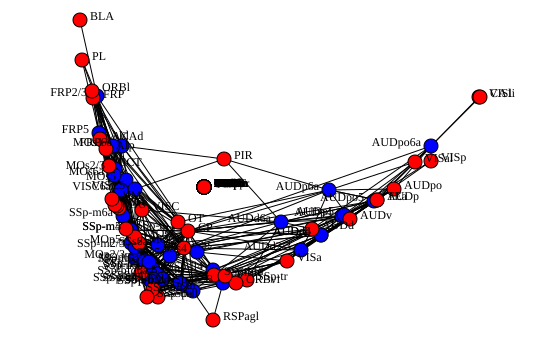

In [440]:
SVG(image)

In [692]:
#bie = BiLouvainEmbedding()
bispectral = BiSpectral( normalized=False)
matty = np.asarray(wt_conn)[nonzero_ind]
nwz = np.zeros(matty.shape)
nwz[np.where(matty > 1e-1)] = 1
bispectral.fit_transform(csr_matrix(nwz[:43,:101]))

embedding_row = bispectral.embedding_row_
embedding_row.shape

embedding_col = bispectral.embedding_col_
embedding_col.shape
names_row = wt_conn_nonzero.index[:43]
names_col = np.asarray(list(wt_conn_nonzero.columns))[:101,1]

In [693]:
image = svg_bigraph(csr_matrix(top5z), names_row, names_col,
                    position_row=embedding_row + [0,2] , position_col=embedding_col,
                    color_row='blue', color_col='red', display_edge_weight = False,edge_width = .1,font_size = 10)


#SVG(image)

In [694]:
image = svg_bigraph(csr_matrix(top5z), names_row, names_col,
                    position_row=embedding_row  , position_col=embedding_col,
                    color_row='blue', color_col='red', display_edge_weight = False,edge_width = .1,font_size = 10, 
                    filename='bispectral')

#svg_plot = SVG(image)#, filename='/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/KoelleConnectivity/figs/cortex_network')

In [695]:
# import sys
# !{sys.executable} -m pip install cairosvg

In [696]:
import cairosvg
from cairosvg import svg2png

In [699]:
svg2png(bytestring=image,write_to='bispectral_st.png', dpi = 800, scale = 10)

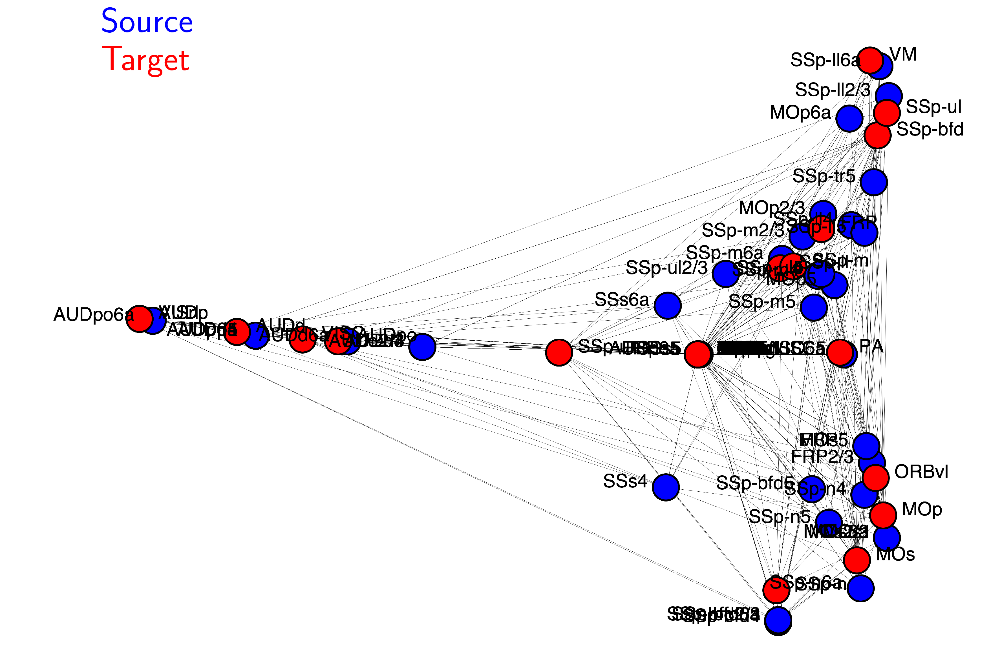

In [700]:
fig, ax = plt.subplots(figsize = (15,15), dpi = 300)
ax.imshow(plt.imread('bispectral_st.png'))
plt.axis('off')
ax.text(500,50,'Source',c = 'blue', size = 30)
ax.text(500,250,'Target',c = 'red', size = 30)
plt.savefig('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/KoelleConnectivity/figs/st_graph')
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)

In [701]:
# fig, ax = plt.subplots(figsize = (15,15), dpi = 300)
# ax.imshow(plt.imread('bispectral_output.png'))
# plt.axis('off')
# ax.text(500,50,'Source',c = 'blue', size = 30)
# ax.text(500,250,'Target',c = 'red', size = 30)
# plt.savefig('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/KoelleConnectivity/figs/st_graph')
# #ax.get_xaxis().set_visible(False)
# #ax.get_yaxis().set_visible(False)

In [674]:
biadjacency.todense().min()

0.0

In [666]:
bipagerank = BiPageRank()
biadjacency = csr_matrix(nwz[:43,:101])
bipagerank.fit(biadjacency)
scores_row = bipagerank.scores_row_
scores_col = bipagerank.scores_col_

In [675]:
image = svg_bigraph(biadjacency, names_row, names_col,
                    scores_row=scores_row, scores_col=scores_col)

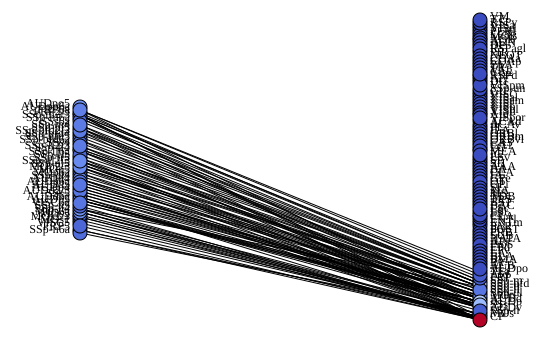

In [676]:
SVG(image)

In [464]:
from sknetwork.ranking import PageRank, BiPageRank

In [543]:
wt_conn_leaf = pd.read_csv('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/connectivities/elsumsurfleafsmth_v3_leafleaf_wt.csv', header = [0,1])
wt_conn_leaf = fix_pdcsv(wt_conn_leaf)


In [652]:
st_avail = wt_conn_leaf.iloc[nonzero_ind,nonzero_ind]
st_avail_bin = np.zeros(st_avail.shape)
st_avail_bin[st_avail > 1e-2] = 1
st_avail_bin.transpose()[st_avail > 1e-2] = 1
st_avail_bin = st_avail_bin[:43,:43]

In [653]:
from sknetwork.embedding import Spectral

In [654]:
spectral = Spectral( normalized=False)
spectral.fit_transform(csr_matrix(np.asarray(st_avail_bin, dtype = bool)))

embedding = spectral.embedding_
#embedding_row.shape



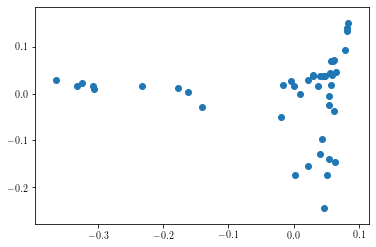

In [655]:
plt.scatter(embedding[:,0], embedding[:,1])

In [656]:
pagerank = PageRank(damping_factor = .1)
scores = pagerank.fit_transform(st_avail_bin)

In [657]:
scores1 = scores

In [658]:
st_avail_bin = np.asarray(st_avail_bin, dtype = int)

In [659]:
image = svg_graph(csr_matrix(st_avail_bin), embedding, scores= (scores))

In [662]:
wt_conn_leaf.index[scores.argsort()[-10:]]

Index(['FRP6b', 'SSp-m5', 'SSp-ll4', 'SSp-m2/3', 'FRP6a', 'MOp6a', 'MOp5',
       'SSp-ll5', 'MOp1', 'SSp-ll6a'],
      dtype='object')

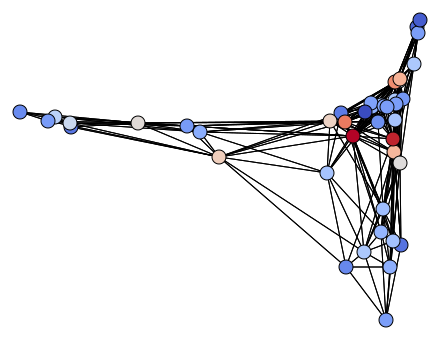

In [660]:
SVG(image)

In [702]:
st_avail = wt_conn_leaf.iloc[nonzero_ind,nonzero_ind]
st_avail_bin = np.zeros(st_avail.shape)
st_avail_bin[st_avail > 1e-2] = 1
st_avail_bin = st_avail_bin[:43,:43]
pagerank = PageRank()
scores = pagerank.fit_transform(st_avail_bin)
spectral = BiSpectral( normalized=False)
position = spectral.fit_transform(csr_matrix(np.asarray(st_avail_bin, dtype = bool)))
image = svg_digraph(csr_matrix(np.asarray(st_avail_bin, dtype = bool)), position, scores=scores, names= wt_conn_leaf.index[nonzero_ind])

In [703]:
svg2png(bytestring=image,write_to='bispectral_page.png', dpi = 800, scale = 10)

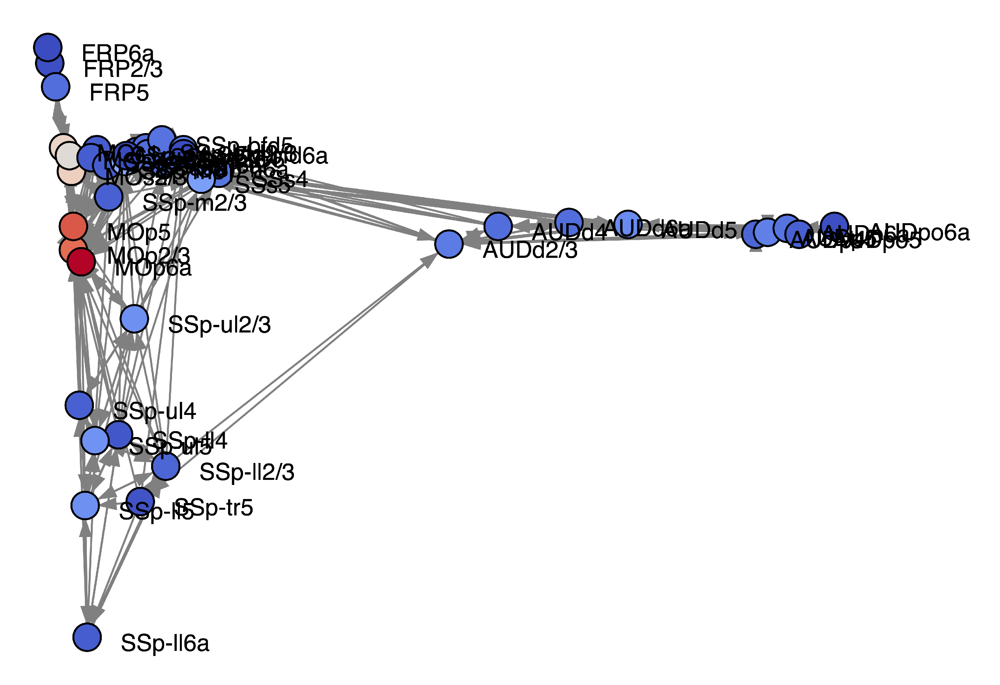

In [704]:
fig, ax = plt.subplots(figsize = (15,15), dpi = 300)
ax.imshow(plt.imread('bispectral_page.png'))
plt.axis('off')
plt.savefig('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/KoelleConnectivity/figs/page_graph')
#ax.get_xaxis().set_visible(False)
#ax.get_yaxis().set_visible(False)

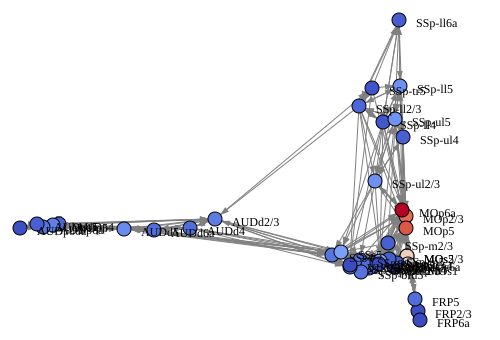

In [688]:
SVG(image)

In [10]:
# TOP_DIR = '/Users/samsonkoelle/alleninstitute/mcm_2020/mcm_updated/'
# INPUT_JSON = os.path.join(TOP_DIR, 'input_011520.json')
# EXPERIMENTS_EXCLUDE_JSON = os.path.join(TOP_DIR, 'experiments_exclude.json')
# FILE_DIR = '/Users/samsonkoelle/alleninstitute/mcm_2020/mcm_updated/'
# OUTPUT_DIR = os.path.join(FILE_DIR, 'output')

# mcc = MouseConnectivityCache(manifest_file = '../connectivity/mouse_connectivity_manifest.json')
# st = mcc.get_structure_tree()
# ai_map = st.get_id_acronym_map()
# ia_map = {value: key for key, value in ai_map.items()}


# input_data = ju.read(INPUT_JSON)
# manifest_file = input_data.get('manifest_file')
# manifest_file = os.path.join(TOP_DIR, manifest_file)
# experiments_exclude = ju.read(EXPERIMENTS_EXCLUDE_JSON)

# #its unclear why the hyperparameters are loaded from the output directory
# cache = VoxelModelCache(manifest_file=manifest_file)

# columns = np.asarray(list(wt_conn_nonzero.columns))
# shapes = np.zeros(wt_conn_nonzero_log.shape[1])
# for i in range(wt_conn_nonzero_log.shape[1]):
#     print(i)
#     iii = columns[i][1]
#     hemi = columns[i][0]
#     if hemi == 'ipsi':
#         mask = Mask.from_cache(cache,structure_ids=[ai_map[iii]],hemisphere_id=2)
#     if hemi == 'contra':
#         mask = Mask.from_cache(cache,structure_ids=[ai_map[iii]],hemisphere_id=1)
#     shapes[i] = mask.coordinates.shape[0]

In [11]:
# #densities = wt_conn_nonzero / shapes

# #logthresh = -5
# import sys
# !{sys.executable} -m pip install scikit-network

In [12]:
from sknetwork.embedding import BiLouvainEmbedding, BiSpectral

In [13]:
from sknetwork.data import movie_actor

In [14]:
from scipy.sparse import csr_matrix

array(['FRP', 'MOp', 'MOs', 'SSp-n', 'SSp-bfd', 'SSp-ll', 'SSp-m',
       'SSp-ul', 'SSp-tr', 'SSp-un', 'SSs', 'GU', 'VISC', 'AUDd', 'AUDp',
       'AUDpo', 'AUDv', 'VISal', 'VISam', 'VISl', 'VISp', 'VISpl',
       'VISpm', 'VISli', 'VISpor', 'ACAd', 'ACAv', 'PL', 'ILA', 'ORBl',
       'ORBm', 'ORBvl', 'AId', 'AIp', 'AIv', 'RSPagl', 'RSPd', 'RSPv',
       'VISa', 'VISrl', 'TEa', 'PERI', 'ECT', 'MOB', 'AOB', 'AON', 'TT',
       'DP', 'PIR', 'NLOT', 'COAa', 'COAp', 'PAA', 'TR', 'CA1', 'CA2',
       'CA3', 'DG', 'FC', 'IG', 'ENTl', 'ENTm', 'PAR', 'POST', 'PRE',
       'SUB', 'ProS', 'HATA', 'APr', 'CLA', 'EPd', 'EPv', 'LA', 'BLA',
       'BMA', 'PA', 'CP', 'ACB', 'FS', 'OT', 'LSc', 'LSr', 'LSv', 'SF',
       'SH', 'AAA', 'BA', 'CEA', 'IA', 'MEA', 'GPe', 'GPi', 'SI', 'MA',
       'MS', 'NDB', 'TRS', 'BST', 'BAC', 'VAL', 'VM', 'VPL', 'VPLpc',
       'VPM', 'VPMpc', 'PoT', 'SPFm', 'SPFp', 'SPA', 'PP', 'MG', 'LGd',
       'LP', 'PO', 'POL', 'SGN', 'AV', 'AM', 'AD', 'IAM', 'IAD', 'LD',
       

In [15]:
#bie = BiLouvainEmbedding()
bispectral = BiSpectral()
bispectral.fit_transform(csr_matrix(np.asarray(wt_conn)[nonzero_ind]))

array([[-0.57797999, -0.81605094],
       [-0.60118835, -0.79910736],
       [-0.61636063, -0.78746401],
       [-0.57789564, -0.81611067],
       [-0.61114389, -0.79151952],
       [-0.59493821, -0.80377144],
       [-0.58049837, -0.81426141],
       [-0.58312895, -0.81237961],
       [-0.60526116, -0.79602696],
       [-0.6059529 , -0.79550052],
       [-0.58193682, -0.813234  ],
       [-0.58378315, -0.81190962],
       [-0.58315382, -0.81236176],
       [-0.56458175, -0.82537715],
       [-0.5774688 , -0.81641275],
       [-0.59734249, -0.80198625],
       [-0.57488916, -0.8182313 ],
       [-0.55187733, -0.83392531],
       [-0.57116002, -0.82083873],
       [-0.61782976, -0.78631189],
       [-0.57150953, -0.82059543],
       [-0.57394801, -0.81889174],
       [-0.58631529, -0.81008295],
       [-0.59988617, -0.80008536],
       [-0.58399721, -0.81175567],
       [-0.56223762, -0.82697573],
       [-0.59556036, -0.80331056],
       [-0.59574013, -0.80317725],
       [-0.59493485,

In [40]:
#bie = BiLouvainEmbedding()
bispectral = BiSpectral()
matty = np.asarray(wt_conn)[nonzero_ind]
nwz = np.zeros(matty.shape)
nwz[np.where(matty > 1e-2)] = 1
bispectral.fit_transform(csr_matrix(nwz))

embedding_row = bispectral.embedding_row_
embedding_row.shape

embedding_col = bispectral.embedding_col_
embedding_col.shape
names_row = wt_conn_nonzero.index
names_col = wt_conn_nonzero.columns

array([[ 0.96231611, -0.27193329],
       [ 0.9520241 , -0.30602307],
       [ 0.93358746, -0.35834963],
       [ 0.91454188, -0.40449121],
       [ 0.92098077, -0.38960803],
       [ 0.91993333, -0.39207481],
       [ 0.93730271, -0.34851632],
       [ 0.9342201 , -0.35669708],
       [ 0.94258237, -0.33397375],
       [ 0.92503981, -0.37987018],
       [ 0.91520451, -0.4029897 ],
       [ 0.90620425, -0.42284023],
       [ 0.90623783, -0.42276826],
       [ 0.90548296, -0.42438261],
       [ 0.90543166, -0.42449206],
       [ 0.90752569, -0.41999658],
       [ 0.90854901, -0.41777829],
       [ 0.89617023, -0.44371039],
       [ 0.9078162 , -0.41936827],
       [ 0.82993311, -0.55786292],
       [ 0.91231188, -0.40949607],
       [ 0.91012727, -0.4143288 ],
       [ 0.92051449, -0.39070842],
       [ 0.92267437, -0.38558009],
       [ 0.9191657 , -0.39387108],
       [ 0.90646837, -0.42227372],
       [ 0.75780861, -0.6524769 ],
       [ 0.9165296 , -0.39996687],
       [ 0.90924097,

(621, 2)

In [43]:
from sknetwork.visualization import svg_graph, svg_digraph, svg_bigraph

In [44]:
nwz

array([[1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [45]:
image = svg_bigraph(csr_matrix(nwz), names_row, names_col,
                    position_row=embedding_row, position_col=embedding_col,
                    color_row='blue', color_col='red')

In [46]:
from IPython.display import SVG

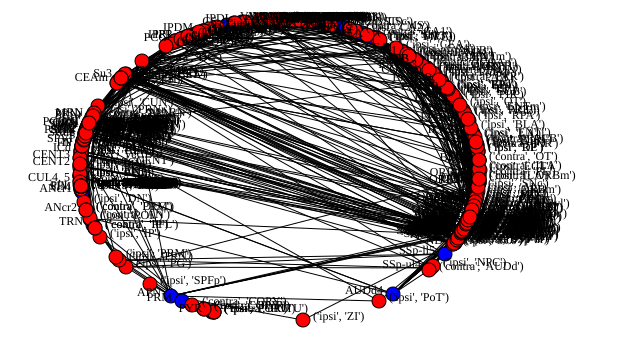

In [47]:
#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [23]:
#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [86]:
#bie = BiLouvainEmbedding()
bispectral = BiSpectral( normalized=False)
matty = np.asarray(wt_conn)[nonzero_ind]
nwz = np.zeros(matty.shape)
nwz[np.where(matty > 5e-2)] = 1
bispectral.fit_transform(csr_matrix(nwz[:50,:100]))

embedding_row = bispectral.embedding_row_
embedding_row.shape

embedding_col = bispectral.embedding_col_
embedding_col.shape
names_row = wt_conn_nonzero.index
names_col = np.asarray(list(wt_conn_nonzero.columns))[:,1]

In [87]:
np.sum(nwz, axis = 1)

array([4., 5., 7., 4., 3., 6., 4., 4., 4., 4., 7., 5., 5., 4., 3., 2., 3.,
       4., 5., 4., 6., 4., 4., 5., 4., 3., 3., 4., 3., 5., 2., 6., 3., 5.,
       5., 3., 4., 4., 2., 4., 5., 6., 6., 5., 5., 5., 3., 8., 5., 5., 4.,
       3., 3., 3., 4., 1., 1., 1., 4., 2., 3., 4., 4., 6., 6., 6., 6., 4.,
       6., 4., 3., 4., 4., 5., 3., 3., 3., 5., 4., 5., 3., 4., 4., 4., 5.,
       5., 3., 4., 4., 4., 4., 4., 5., 5., 5., 4., 6., 4., 2., 3., 2., 3.,
       4., 3., 5., 5., 2., 4., 4., 4., 3., 4., 3., 4., 4., 4., 3., 4., 4.,
       5., 3., 3., 2., 3., 3., 2., 2., 3., 6., 4., 4., 4., 2., 5., 6., 6.,
       5., 5., 4., 6., 5., 3., 2., 3., 4., 2., 5., 3., 2., 3., 3., 3., 2.,
       3., 4., 2., 5., 3., 2., 2., 2., 3., 5., 1., 7., 5., 4., 6., 2., 5.,
       5., 2., 5., 2., 3., 4., 2., 3., 3., 2., 3., 2., 2., 1., 2., 5., 5.])

In [107]:
image = svg_bigraph(csr_matrix(nwz[:50,:100]), names_row, names_col,
                    position_row=embedding_row - [0,1], position_col=embedding_col,
                    color_row='blue', color_col='red', display_edge_weight = True)

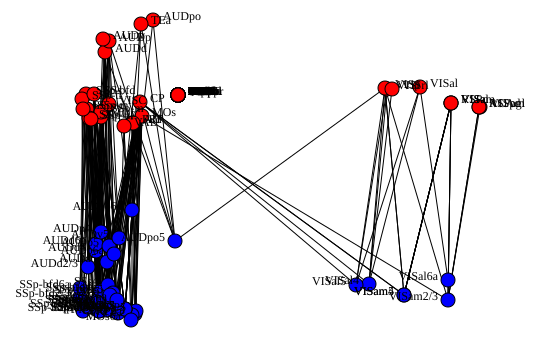

In [108]:
#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [ ]:
from sknetwork.embedding import 

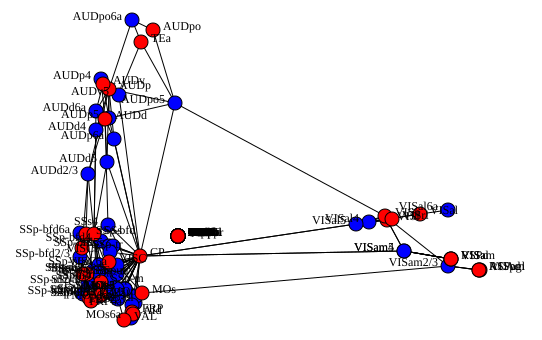

In [106]:
image = svg_bigraph(csr_matrix(nwz[:50,:100]), names_row, names_col,
                    position_row=embedding_row, position_col=embedding_col,
                    color_row='blue', color_col='red', display_edge_weight = True)

#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [95]:
help(karate_club)

Help on function karate_club in module sknetwork.data.toy_graphs:

karate_club(metadata: bool = False) -> Union[scipy.sparse.csr.csr_matrix, sknetwork.utils.Bunch]
    Karate club graph.
    
    * Undirected graph
    * 34 nodes, 78 edges
    * 2 labels
    
    Parameters
    ----------
    metadata :
        If ``True``, return a `Bunch` object with metadata.
    
    Returns
    -------
    adjacency or graph : Union[sparse.csr_matrix, Bunch]
        Adjacency matrix or graph with metadata (labels, positions).
    
    Example
    -------
    >>> from sknetwork.data import karate_club
    >>> adjacency = karate_club()
    >>> adjacency.shape
    (34, 34)
    
    References
    ----------
    Zachary's karate club graph
    https://en.wikipedia.org/wiki/Zachary%27s_karate_club



In [91]:
help(svg_bigraph)

Help on function svg_bigraph in module sknetwork.visualization.graphs:

svg_bigraph(biadjacency: scipy.sparse.csr.csr_matrix, names_row: Union[numpy.ndarray, NoneType] = None, names_col: Union[numpy.ndarray, NoneType] = None, labels_row: Union[numpy.ndarray, dict, NoneType] = None, labels_col: Union[numpy.ndarray, dict, NoneType] = None, scores_row: Union[numpy.ndarray, dict, NoneType] = None, scores_col: Union[numpy.ndarray, dict, NoneType] = None, membership_row: Union[scipy.sparse.csr.csr_matrix, NoneType] = None, membership_col: Union[scipy.sparse.csr.csr_matrix, NoneType] = None, seeds_row: Union[list, dict] = None, seeds_col: Union[list, dict] = None, position_row: Union[numpy.ndarray, NoneType] = None, position_col: Union[numpy.ndarray, NoneType] = None, reorder: bool = True, width: Union[float, NoneType] = 400, height: Union[float, NoneType] = 300, margin: float = 20, margin_text: float = 3, scale: float = 1, node_size: float = 7, node_size_min: float = 1, node_size_max: float 

In [90]:
help(svg_digraph)

Help on function svg_digraph in module sknetwork.visualization.graphs:

svg_digraph(adjacency: Union[scipy.sparse.csr.csr_matrix, NoneType] = None, position: Union[numpy.ndarray, NoneType] = None, names: Union[numpy.ndarray, NoneType] = None, labels: Union[Iterable, NoneType] = None, scores: Union[Iterable, NoneType] = None, membership: Union[scipy.sparse.csr.csr_matrix, NoneType] = None, seeds: Union[list, dict] = None, width: Union[float, NoneType] = 400, height: Union[float, NoneType] = 300, margin: float = 20, margin_text: float = 10, scale: float = 1, node_order: Union[numpy.ndarray, NoneType] = None, node_size: float = 7, node_size_min: float = 1, node_size_max: float = 20, display_node_weight: bool = False, node_weights: Union[numpy.ndarray, NoneType] = None, node_width: float = 1, node_width_max: float = 3, node_color: str = 'gray', display_edges: bool = True, edge_labels: Union[list, NoneType] = None, edge_width: float = 1, edge_width_min: float = 0.5, edge_width_max: float = 

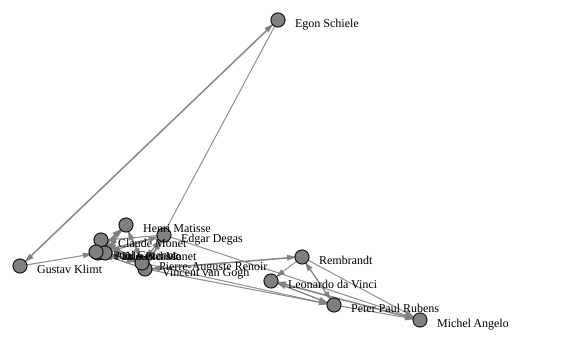

In [89]:
#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [81]:
from sknetwork.data import karate_club, painters, movie_actor
graph = painters(metadata=True)
adjacency = graph.adjacency
position = graph.position
names = graph.names


<14x14 sparse matrix of type '<class 'numpy.bool_'>'
	with 50 stored elements in Compressed Sparse Row format>

In [83]:
bispectral = BiSpectral(2, normalized=False)
embedding = bispectral.fit_transform(adjacency)


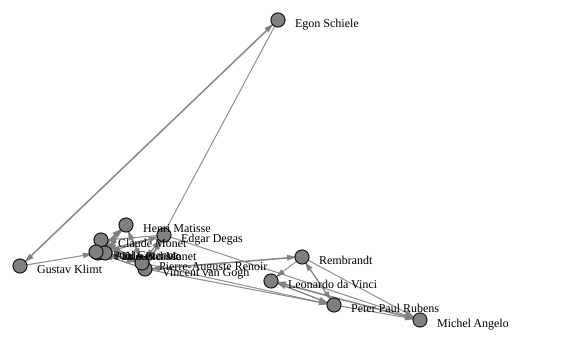

In [85]:
image = svg_digraph(adjacency, embedding, names=names)
SVG(image)

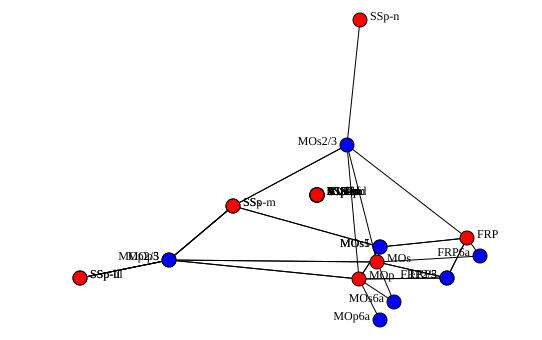

In [61]:
#--NotebookApp.iopub_data_rate_limit
SVG(image)

In [60]:
image.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [59]:
SVG(image)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


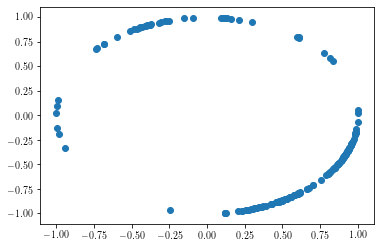

In [47]:
plt.scatter(bie.embedding_[:,0], bie.embedding_[:,1])

In [48]:
bie.embedding_.shape

(187, 2)

In [ ]:
bispectral = BiSpectral()
biadjacency = movie_actor()
embedding = bispectral.fit_transform(biadjacency)

In [103]:
nonzero_ind = np.where(np.sum(wt_conn, axis = 1) > 0)[0]
wt_conn_density = wt_conn / shapes
wt_conn_density_nonzero = wt_conn_density.iloc[nonzero_ind]
log_wt_densities_nonzero = np.asarray(np.log10(wt_conn_density_nonzero))
logthresh = -9
log_wt_densities_nonzero[np.where(log_wt_densities_nonzero < logthresh)] = logthresh

/Users/samsonkoelle/anaconda3/envs/allen_010719_5/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


In [107]:
wt_conn_density.to_csv('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/connectivities/elsumsurfleafsmth_v3_leafsum_wt_density.csv')

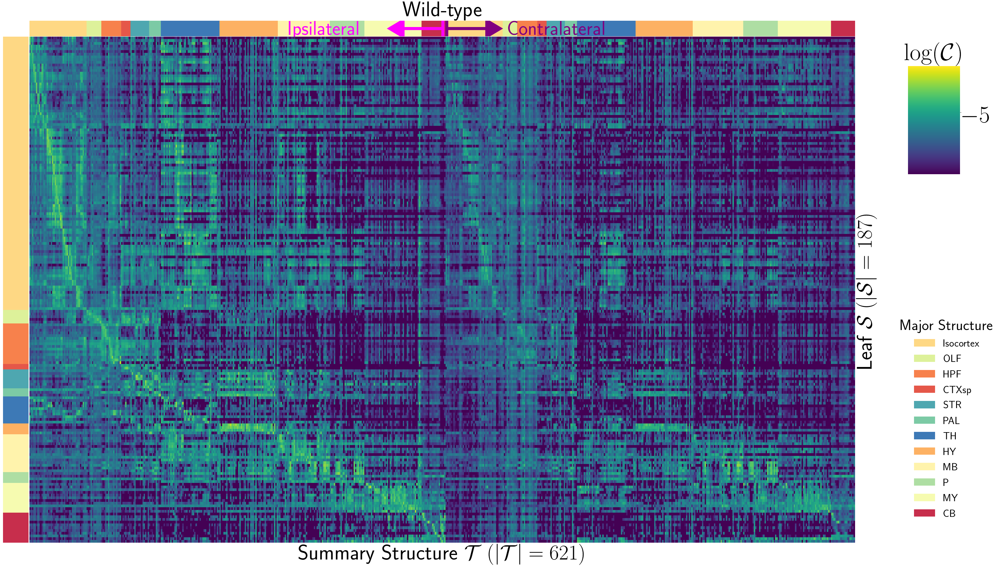

In [104]:
g= sns.clustermap(log_wt_densities_nonzero, col_cluster = False, row_cluster = False, col_colors=ccol, 
                  row_colors = crow, figsize = (40,25), cmap = 'viridis', vmin = -9, vmax = -2,
                 dendrogram_ratio=(0,0.01),cbar_kws={"ticks":[-5,0]})
#labels = list(g.ax_cbar.get_yticklabels()).copy()#g.ax_cbar.get_yticklabels()
#print(list(labels))
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_yticks([])
g.ax_heatmap.set_yticklabels([])
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xlabel('Summary Structure ' + r"$\mathcal T \; (|\mathcal T| = 621)$", fontsize = 70)
g.ax_heatmap.set_ylabel('Leaf ' + r"$\mathcal S \; (|\mathcal S| = 187)$", fontsize = 70)
ax = gcf().add_axes((0.6,1.,0.,0.))
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)
for label in np.asarray(major_structures)[reo]:
    ax.bar(0, 0, color=palette_dict[label], label=label, linewidth=0.)
l4 = ax.legend(title='Major Structure', ncol=1, bbox_to_anchor=(1.16, .45), bbox_transform=gcf().transFigure, fontsize = 35,title_fontsize=50,frameon=False)    
#l4.axset_xticks([])
#l4.axes.set_yticks([])
#l4.axes.set_axis_off()
#l4.axes.s
#l4.xaxis.set_visible(False)
#l4.yaxis.set_visible(False)
g.ax_cbar.set_title(r"$\log (\mathcal C)$", rotation=0, fontsize = 80)
g.ax_cbar.set_yticklabels(g.ax_cbar.get_yticklabels(), fontsize=80)
g.ax_cbar.set_position([1.05,0.7,.06,.2])
g.ax_col_colors.text(195.,.9, 'Ipsilateral', fontsize = 65, color  = 'fuchsia')
g.ax_col_colors.text(360.,.9, 'Contralateral', fontsize = 65, color  = 'purple')
g.ax_col_colors.axvline(311, color = 'fuchsia', linewidth  = 10)
g.ax_col_colors.arrow(311,.5,-30,0, color = 'fuchsia', linewidth  = 10,head_width=1., head_length=10)
g.ax_col_colors.arrow(314,.5,30,0, color = 'purple', linewidth  = 10,head_width=1., head_length=10)
g.ax_col_colors.axvline(314, color = 'purple', linewidth  = 10)
g.ax_col_colors.set_title('Wild-type', fontsize = 70)

plt.margins(x=0,y=0)
#g.savefig('/Users/samsonkoelle/alleninstitute/sambranch/mouse_connectivity_models/paper/figures/wt_connectome3', pad_inches = 0,bbox_inches = 'tight')